In [1]:
'''
Data extracted from zip, then combined part 1 and part 2 into same folder "HAM10000_images" 
''';

In [2]:
import os
import pandas as pd
import numpy as np
from tqdm import tqdm
from matplotlib import pyplot as plt

from os import walk
import time
from datetime import timedelta

from skimage.transform import resize
from skimage.transform import rotate
from skimage.transform import rescale
from skimage.io import imsave, imread

from skimage import color
from skimage.exposure import rescale_intensity

In [3]:
DATA_PATH = "../../Data/"
IMAGES_PATH = DATA_PATH + "HAM10000_images_masked/"
#IMAGES_PATH_SEPARATED = DATA_PATH+"HAM10000_images_separated/"

train_img_path_in  = DATA_PATH + "HAM10000_images_separated/"
#train_img_path_out = DATA_PATH + "HAM10000_images_separated_resized/"
val_img_path_in    = DATA_PATH + "HAM10000_images_separated_masked_validation/"
#val_img_path_out   = DATA_PATH + "HAM10000_images_separated_validation_resized/"

PERFORM_IMAGE_SEPARATION = False

In [4]:
df_meta = pd.read_csv(DATA_PATH+"HAM10000_metadata.csv")
df_meta

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear
...,...,...,...,...,...,...,...
10010,HAM_0002867,ISIC_0033084,akiec,histo,40.0,male,abdomen
10011,HAM_0002867,ISIC_0033550,akiec,histo,40.0,male,abdomen
10012,HAM_0002867,ISIC_0033536,akiec,histo,40.0,male,abdomen
10013,HAM_0000239,ISIC_0032854,akiec,histo,80.0,male,face


In [5]:
# Print Unique classes
class_names = df_meta.dx.unique()
class_names

array(['bkl', 'nv', 'df', 'mel', 'vasc', 'bcc', 'akiec'], dtype=object)

* Actinic Keratoses
* Basal Cell Carcinoma
* Benign Keratosis
* Dermatofibroma
* Malignant Melanoma
* Melanocytic Nevi
* Vascular Lesions

In [6]:
# Get total number of each class data points
data_dx = df_meta.dx.groupby(df_meta.dx).count()
data_dx

dx
akiec     327
bcc       514
bkl      1099
df        115
mel      1113
nv       6705
vasc      142
Name: dx, dtype: int64

In [7]:
class_indices = {"akiec": 0, "bcc": 1, "bkl": 2, "df": 3, "mel": 4, "nv": 5, "vasc": 6}
augment_multiplier = {"akiec": 9, "bcc": 6, "bkl": 3, "df": 24, "mel": 3, "nv": 1, "vasc": 18}

path_in = DATA_PATH +"HAM10000_images_separated/"

test_img_path_1 = "../CNN/input/ISIC_0024617.jpg"
test_img_path_2 = "../CNN/input/ISIC_0024891.jpg"

img_size = (224,224)

## Resize Images
After several atempts on CNN insuficient computing power was noticed, as one of the solutions resizing original images was implemented, first as TensorFlow layer to test and later converting all images to quarter of the size (1/4), allowing to fit simple CNN models within the timeframe allocated.

#### Display Anti-Aliasing

Difference between anti-aliasing enabled and disabled can be seen on images below. Choise is made towards disabling anti-aliasing as blur is making small details harder to see and therefore harder to distinguish.

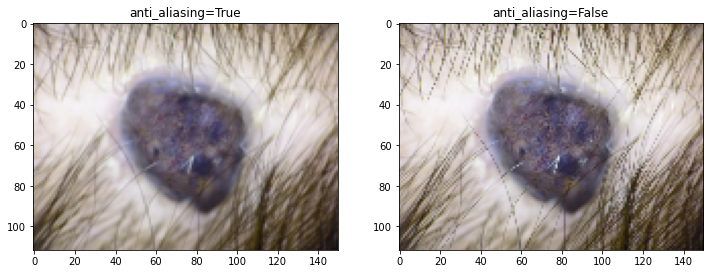

In [48]:
img = imread(test_img_path_2, as_gray=False)
img_rescaled_aa_true  = rescale(img, 0.25, anti_aliasing=True, multichannel=True)
img_rescaled_aa_false = rescale(img, 0.25, anti_aliasing=False, multichannel=True)

imsave("output/test_aa_true.png",  (img_rescaled_aa_true* 255).astype(np.uint8))
imsave("output/test_aa_false.png", (img_rescaled_aa_false*255).astype(np.uint8))

#fig, axes = plt.subplots(nrows=1, ncols=2)
fig = plt.figure(figsize=(12,6))
ax  = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax.imshow(img_rescaled_aa_true)
ax2.imshow(img_rescaled_aa_false)
ax.set_title("anti_aliasing=True")
ax2.set_title("anti_aliasing=False")

plt.show()

#### Rescale Image

In [9]:
def img_to_uint8(img: np.ndarray) -> np.ndarray:
    return (img* 255).astype(np.uint8)

In [10]:
def rescale_img(path: str) -> np.ndarray:
    # Read image from path and rescale using skimage by 0.25
    img = imread(path, as_gray=False)
    img_resized = rescale(img, 0.25, anti_aliasing=False, multichannel=True)
    return img_resized

## Resize
Previous function "rescale" did a good job, but in parallel research came to a stage where transfer learning was considered as an option. In transfer learning for VGG16 and ResNet50 input shape is 224 by 224 is used. Therefore resizing was combined with previous image separation function to produce resized and separated images.

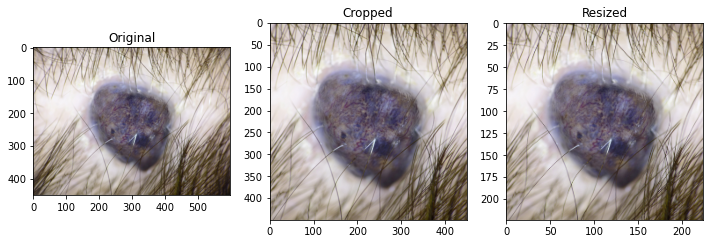

In [49]:
img = imread(test_img_path_2, as_gray=False)
# To maintain aspect ratio before resizing image is cropped 
# from both sides(left and right) by 75 pixels
# width minus height then divided by 2 (600-450)/2=75
img_cropped = img[0:450,75:525]
img_resized = resize(img_cropped, (224,224), anti_aliasing=False)

fig = plt.figure(figsize=(12,6))
ax  = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)
ax.imshow(img)
ax2.imshow(img_cropped)
ax3.imshow(img_resized)
ax.set_title("Original")
ax2.set_title("Cropped")
ax3.set_title("Resized")

#plt.imshow(img_resized)
plt.show()

In [12]:
def resize_img(path: str, size: tuple=(224,224)):
    img = imread(path, as_gray=False)
    # To maintain aspect ratio before resizing image is cropped 
    # from both sides(left and right) by 75 pixels
    # width minus height then divided by 2 (600-450)/2=75
    img_cropped = img[0:450,75:525]
    img_resized = resize(img_cropped, size, anti_aliasing=False) #(224,224)
    return img_resized

## Image Separation and Resizing

In [13]:
validation_split = 0.1

if PERFORM_IMAGE_SEPARATION:
    # Create folder for every class
    for dx in class_names:
        try:
            os.makedirs(train_img_path_in+dx)
        except OSError:
            pass
        try:
            os.makedirs(val_img_path_in+dx)
        except OSError:
            pass
    
    # Counting how many images goes to folders
    count =  dict(zip(class_names, [0 for _ in range(len(class_names))]))
    
    # Copy image into relevant folder
    for index, row in tqdm(df_meta.iterrows()):
        # keep putting images into validation folder (unseen data)
        # until there is enough, put the rest into training folder
        if count[row.dx] <= int(data_dx[row.dx] * validation_split):
            path = val_img_path_in
            count[row.dx] += 1
        else:
            path = train_img_path_in
        #shutil.copy2(IMAGES_PATH+row.image_id+".jpg", path+row.dx)
        img = resize_img(IMAGES_PATH+row.image_id+".jpg")
        imsave(path+"/"+row.dx+"/"+row.image_id+".jpg", img_to_uint8(img), check_contrast=False)
        
    # Print current validation proportions (check)
    for class_name in class_names:
        val_percent = round(count[class_name]/data_dx[class_name], 4)
        print("{:6}{}%".format(class_name, val_percent)) 

## Rotate
Preferable would be to rotate image and only then crop it to desired size (224,224) to maintain more data, as can be seen in example below. At the later stage complications with this approach were detected. Problem was in aspect ratio of rotated image. When 16 by 9 image is rotated 90 degrees it becomes 9 by 16 image. Resizing horizontal and vertical images same way would disturb the X and Y ratio. Information loss in rotation is considered to be minimal and acceptable.

Text(0.5, 1.0, 'Rotate then Crop')

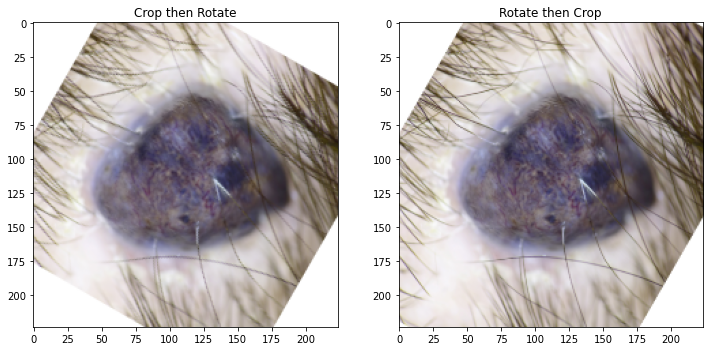

In [14]:
# Rotate already resized image
img_resized = resize_img(test_img_path_2)
img_rotated = rotate(img_resized, 60, cval=1) # cval is BG color value

# Rotate image first then resize it
img = imread(test_img_path_2, as_gray=False)
img_rotated2 = rotate(img, 60, cval=1) # cval is BG color value
img_rotated2 = img_rotated2[0:450,75:525]
img_rotated2 = resize(img_rotated2, (224,224), anti_aliasing=False)

# Plot images
fig = plt.figure(figsize=(12,6))
ax  = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax.imshow(img_rotated)
ax2.imshow(img_rotated2)
ax.set_title("Crop then Rotate")
ax2.set_title("Rotate then Crop")

In [15]:
path_out = DATA_PATH +"HAM10000_images_separated_rotated/"

In [16]:
def rotate_img(path: str, degrees: int=45,
              out_size: tuple=(224,224) ) -> np.ndarray:
    # Rotate image first then resize it
    img = imread(path, as_gray=False)
    img_rotated = rotate(img, degrees, cval=1) # cval is BG color value, white is closer to skin color
    if img.shape[0] != img.shape[1]: # don't cut sides if image is already a square
        img_rotated = img_rotated[0:450,75:525]
    img_rotated = resize(img_rotated, out_size, anti_aliasing=False)

    return img_rotated #(img_resized* 255).astype(np.uint8)

## Apply defined Function to all images

In [17]:
def apply_all_img(path_in: str, path_out: str, func) -> None:
    # Measure time
    start_time = time.time()
    # Check folder within the path
    for (dirpath, dirnames, _) in walk(path_in):
        # For every folder within the path
        for directory in dirnames:
            curr_folder = "{}{}/".format(dirpath, directory)
            # Check files within the folder
            for (dirp, _, files) in walk(curr_folder):
                print("{:50}{:6}".format(dirp,len(files)))
                try: # Create a folder if not exists
                    os.makedirs(path_out+"/"+directory)
                except OSError:
                    pass
                
                if directory == "nv":
                    # get second half for nevi only, to balance
                    files = files[ int(len(files)/2) :]

                # For every file within the folder            
                for f in tqdm(files):
                    # Apply augmentation to an image number of times
                    img_path = "{}{}".format(dirp,f)
                    save_path = "{}{}/{}".format(path_out,directory,f)
                    func(img_path, save_path, directory)                    

    #remove_half_nv(path_out+"nv/")
    print("Time Elapsed : ", timedelta(seconds=(time.time() - start_time)))

In [18]:
def apply_rotation_n_times(img_path: str, img_path_out: str, img_class: str) -> None:
    dot_index = -4
    augment_n = augment_multiplier[img_class]
    for i in range(augment_n):
        # Calculate degrees for next rotation and save image with rotation added to name
        rotation = round(i*360/augment_n,0)
        img = rotate_img(img_path, rotation)
        img_save_path = "{0}_{1:.0f}{2}".format(img_path_out[:dot_index],rotation,img_path_out[dot_index:])
        
        # Save image, suppress low contrast warning
        imsave(img_save_path, img_to_uint8(img), check_contrast=False, quality=100) #, cmap=cm.gray)

In [19]:
apply_all_img(path_in, path_out, apply_rotation_n_times) 

../../Data/HAM10000_images_separated/akiec/          294


100%|████████████████████████████████████████████████████████████████████████████████| 294/294 [00:50<00:00,  5.85it/s]


../../Data/HAM10000_images_separated/bcc/            462


100%|████████████████████████████████████████████████████████████████████████████████| 462/462 [00:52<00:00,  8.73it/s]


../../Data/HAM10000_images_separated/bkl/            989


100%|████████████████████████████████████████████████████████████████████████████████| 989/989 [00:56<00:00, 17.48it/s]


../../Data/HAM10000_images_separated/df/             103


100%|████████████████████████████████████████████████████████████████████████████████| 103/103 [00:46<00:00,  2.21it/s]


../../Data/HAM10000_images_separated/mel/           1001


100%|██████████████████████████████████████████████████████████████████████████████| 1001/1001 [00:57<00:00, 17.40it/s]


../../Data/HAM10000_images_separated/nv/            6034


100%|██████████████████████████████████████████████████████████████████████████████| 3017/3017 [00:58<00:00, 51.69it/s]


../../Data/HAM10000_images_separated/vasc/           127


100%|████████████████████████████████████████████████████████████████████████████████| 127/127 [00:43<00:00,  2.95it/s]

Time Elapsed :  0:06:05.343453


## CROP AND FLIP IMAGE

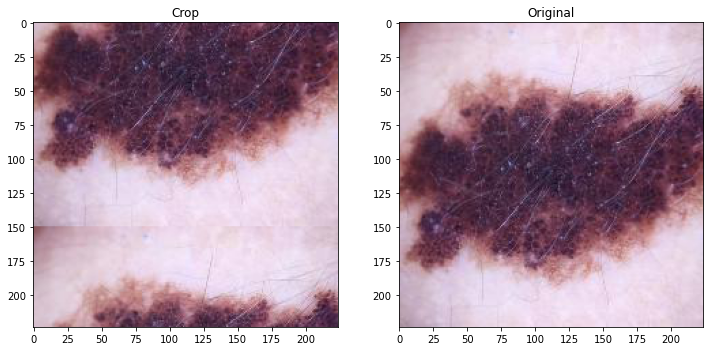

In [20]:
img = imread(test_img_path_1, as_gray=False)
# x1:x2, y1:y2
crop_start = int(img_size[0]/3)
crop_end   = int(img_size[0]+1)
img_cropped_1 = img[0:crop_start,:]
img_cropped_2 = img[crop_start:crop_end,:]

img_new = np.concatenate((img_cropped_2, img_cropped_1))

fig = plt.figure(figsize=(12,6))
ax  = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax.imshow(img_new)
ax2.imshow(img)
ax.set_title("Crop")
ax2.set_title("Original");

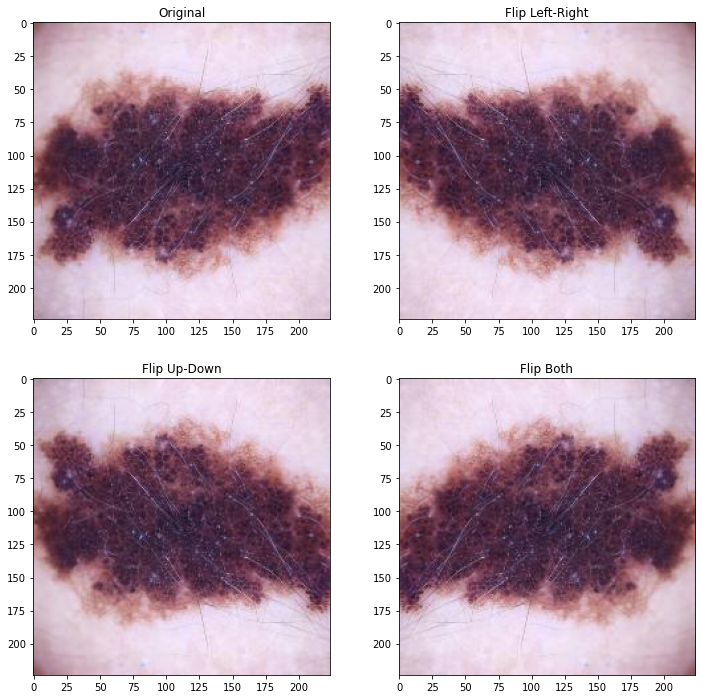

In [21]:
img = imread(test_img_path_1, as_gray=False)
# x1:x2, y1:y2
flip_img_ud = np.flipud(img)
flip_img_lr = np.fliplr(img)
flip_img_both = np.flipud(flip_img_lr)

fig = plt.figure(figsize=(12,12))
ax  = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3  = fig.add_subplot(223)
ax4 = fig.add_subplot(224)
ax.imshow(img)
ax2.imshow(flip_img_lr)
ax3.imshow(flip_img_ud)
ax4.imshow(flip_img_both)
ax.set_title("Original")
ax2.set_title("Flip Left-Right")
ax3.set_title("Flip Up-Down")
ax4.set_title("Flip Both");

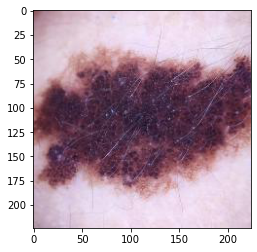

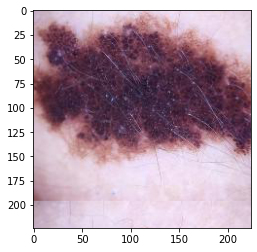

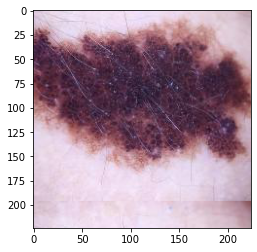

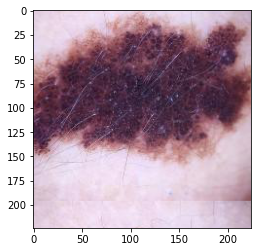

In [22]:
dot_index = -4
path_out = "output/crop_test/"
img = imread(test_img_path_1, as_gray=False)
augment_n = 3# augment_multiplier["df"] # img_class
plt.imshow(img)
plt.show()

for i in range(int(augment_n/3)):
    flip_img_ud = np.flipud(img)
    flip_img_lr = np.fliplr(img)
    flip_img_both = np.flipud(flip_img_lr)
    
    flipped = [flip_img_ud, flip_img_lr, flip_img_both]
    cycles  = int(augment_n/3)

    for j in range(cycles):
        for img_flipped in flipped:
            # x1:x2, y1:y2
            crop_start = int(img_size[0]/8*(1+j))
            crop_end   = int(img_size[0]+1)
            img_cropped_1 = img_flipped[0:crop_start,:]
            img_cropped_2 = img_flipped[crop_start:crop_end,:]
            img_cropped = np.concatenate((img_cropped_2, img_cropped_1))
            
            img_save_path = "{}{}_{}{}".format(
                path_out,"test_flip_crop",j,".jpg")
            imsave(img_save_path, img_cropped, check_contrast=False, quality=100)
            
            plt.imshow(img_cropped)
            plt.show()

In [23]:
path_out = DATA_PATH +"HAM10000_images_separated_cropped_flipped/"

In [24]:
def apply_crop_flip_n_times(img_path: str, img_path_out: str, img_class: str) -> None:
    dot_index = -4    
    img = imread(img_path, as_gray=False)
    augment_n = augment_multiplier[img_class]
    
    if img_class == "nv":
        imsave(img_path_out, img, check_contrast=False, quality=100)
        return
    
    for i in range(int(augment_n/3)):
        flip_img_ud = np.flipud(img)
        flip_img_lr = np.fliplr(img)
        flip_img_both = np.flipud(flip_img_lr)

        flipped = [flip_img_ud, flip_img_lr, flip_img_both]
        # 3 times less as 3 flip augmentations already performed
        cycles  = int(augment_n/3) 

        for j in range(cycles):
            for k,img_flipped in enumerate(flipped):
                # x1:x2, y1:y2
                # 24 is max amount of augmentations
                # 3 flip augmentations already done
                # therefore 24/3=8 is a max range of crop augmentations
                crop_start = int(img_size[0]/8*(1+j)) 
                crop_end   = int(img_size[0]+1)
                img_cropped_1 = img_flipped[0:crop_start,:]
                img_cropped_2 = img_flipped[crop_start:crop_end,:]
                img_cropped = np.concatenate((img_cropped_2, img_cropped_1))
                img_save_path = "{0}_{1}{2}{3}".format(
                    img_path_out[:dot_index],j,k,img_path_out[dot_index:])
        
                imsave(img_save_path, img_cropped, check_contrast=False, quality=100)

apply_all_img(path_in, path_out, apply_crop_flip_n_times) 

../../Data/HAM10000_images_separated/akiec/          294


100%|████████████████████████████████████████████████████████████████████████████████| 294/294 [00:15<00:00, 18.82it/s]


../../Data/HAM10000_images_separated/bcc/            462


100%|████████████████████████████████████████████████████████████████████████████████| 462/462 [00:10<00:00, 42.40it/s]


../../Data/HAM10000_images_separated/bkl/            989


100%|███████████████████████████████████████████████████████████████████████████████| 989/989 [00:07<00:00, 139.68it/s]


../../Data/HAM10000_images_separated/df/             103


100%|████████████████████████████████████████████████████████████████████████████████| 103/103 [00:37<00:00,  2.78it/s]


../../Data/HAM10000_images_separated/mel/           1001


100%|█████████████████████████████████████████████████████████████████████████████| 1001/1001 [00:07<00:00, 139.22it/s]


../../Data/HAM10000_images_separated/nv/            6034


100%|█████████████████████████████████████████████████████████████████████████████| 3017/3017 [00:07<00:00, 408.95it/s]


../../Data/HAM10000_images_separated/vasc/           127


100%|████████████████████████████████████████████████████████████████████████████████| 127/127 [00:24<00:00,  5.14it/s]

Time Elapsed :  0:01:50.008549


## ZOOM IMAGE

In [25]:
path_out = DATA_PATH +"HAM10000_images_separated_zoomed/"

In [26]:
def zoom_img(img: np.ndarray, zoom: float) -> np.ndarray:
    crop_px = int((img.shape[0] - img.shape[0]*zoom)/2)
    
    crop_start = crop_px 
    crop_end   = img.shape[0] - crop_px
    img_cropped = img[crop_start:crop_end, crop_start:crop_end]
    
    ratio = img.shape[0] / img_cropped.shape[0]
    img_resized = rescale(img_cropped, ratio, anti_aliasing=False, multichannel=True)
    return img_resized

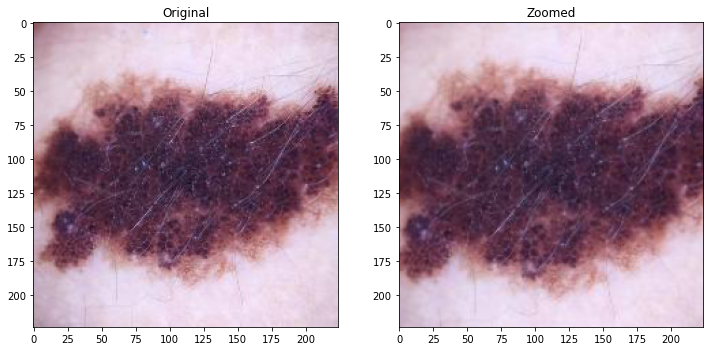

In [27]:
img = imread(test_img_path_1, as_gray=False)
# x1:x2, y1:y2
img_zoomed = zoom_img(img, 0.9)
fig = plt.figure(figsize=(12,12))
ax  = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax.imshow(img)
ax2.imshow(img_zoomed)
ax.set_title("Original")
ax2.set_title("Zoomed");

In [28]:
def apply_zoom_n_times(img_path: str, img_path_out: str, img_class: str) -> None:
    dot_index = -4    
    img = imread(img_path, as_gray=False)
    augment_n = augment_multiplier[img_class]
    
    if img_class == "nv":
        imsave(img_path_out, img, check_contrast=False, quality=100)
        return
    
    step = 0.48 / augment_n
    for i in range(1,augment_n+1):
        zoom = 1-step*i
        img_zoomed = zoom_img(img, zoom)
        img_save_path = "{0}_{1:.3f}{2}".format(
                    img_path_out[:dot_index],zoom,img_path_out[dot_index:])
        imsave(img_save_path, img_to_uint8(img_zoomed), check_contrast=False, quality=100)
apply_all_img(path_in, path_out, apply_zoom_n_times) 

../../Data/HAM10000_images_separated/akiec/          294


100%|████████████████████████████████████████████████████████████████████████████████| 294/294 [00:29<00:00,  9.82it/s]


../../Data/HAM10000_images_separated/bcc/            462


100%|████████████████████████████████████████████████████████████████████████████████| 462/462 [00:32<00:00, 14.18it/s]


../../Data/HAM10000_images_separated/bkl/            989


100%|████████████████████████████████████████████████████████████████████████████████| 989/989 [00:35<00:00, 28.08it/s]


../../Data/HAM10000_images_separated/df/             103


100%|████████████████████████████████████████████████████████████████████████████████| 103/103 [00:29<00:00,  3.54it/s]


../../Data/HAM10000_images_separated/mel/           1001


100%|██████████████████████████████████████████████████████████████████████████████| 1001/1001 [00:36<00:00, 27.58it/s]


../../Data/HAM10000_images_separated/nv/            6034


100%|█████████████████████████████████████████████████████████████████████████████| 3017/3017 [00:08<00:00, 364.23it/s]


../../Data/HAM10000_images_separated/vasc/           127


100%|████████████████████████████████████████████████████████████████████████████████| 127/127 [00:27<00:00,  4.69it/s]

Time Elapsed :  0:03:18.557137


## COLOR CHANGE OBSERVATION

### ZDH

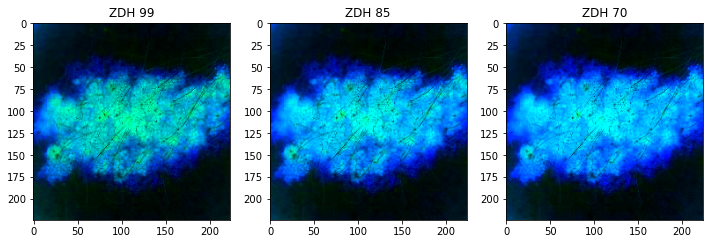

In [29]:
img = imread(test_img_path_1, as_gray=False)

def get_zdh(img, ratio):
    # immunohistochemical staining
    ihc_hed = color.rgb2hed(img)
    h = rescale_intensity(ihc_hed[:, :, 0], out_range=(0, 1),
                          in_range=(0, np.percentile(ihc_hed[:, :, 0], 99)))
    d = rescale_intensity(ihc_hed[:, :, 2], out_range=(0, 1),
                          in_range=(0, np.percentile(ihc_hed[:, :, 2], ratio)))
    null = np.zeros_like(ihc_hed[:, :, 0])
    zdh = np.dstack((null,h,d))
    return zdh

fig = plt.figure(figsize=(12,12))
ax  = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)
ax.imshow(get_zdh(img, 99))
ax2.imshow(get_zdh(img, 85))
ax3.imshow(get_zdh(img, 70))
ax.set_title("ZDH 99")
ax2.set_title("ZDH 85")
ax3.set_title("ZDH 70");

Range : 0


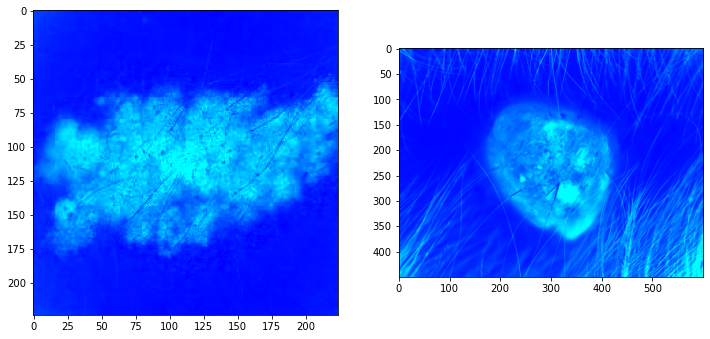

Range : 5


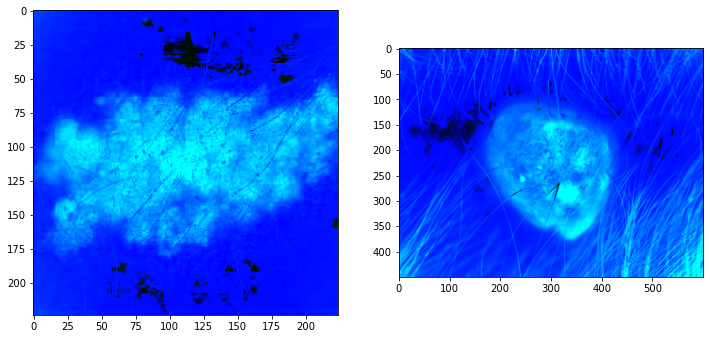

Range : 10


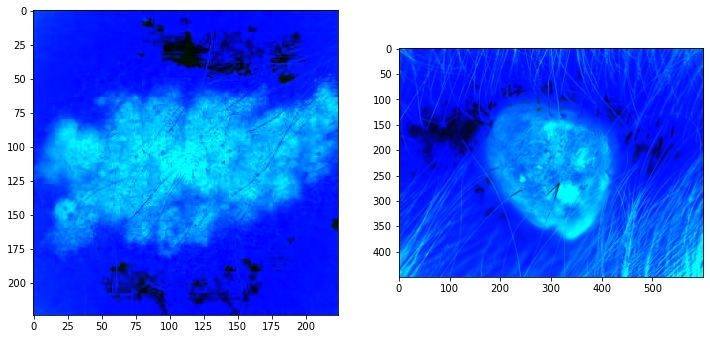

Range : 15


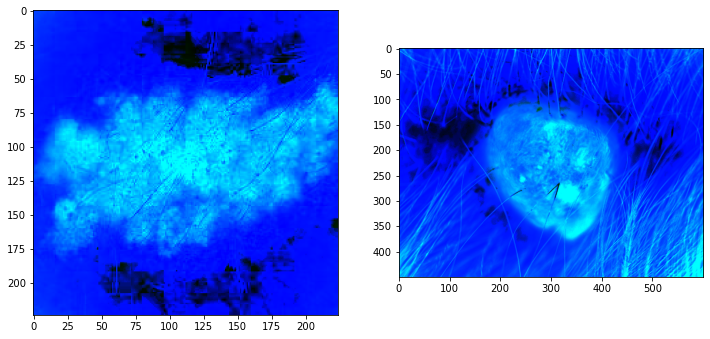

Range : 20


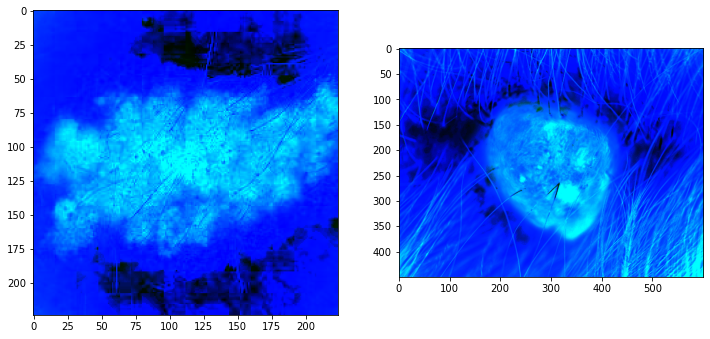

Range : 25


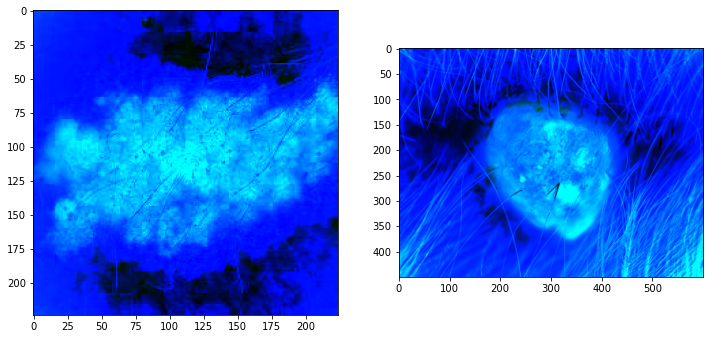

Range : 30


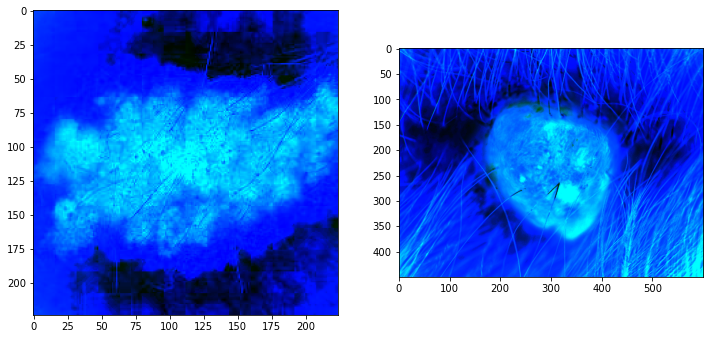

Range : 35


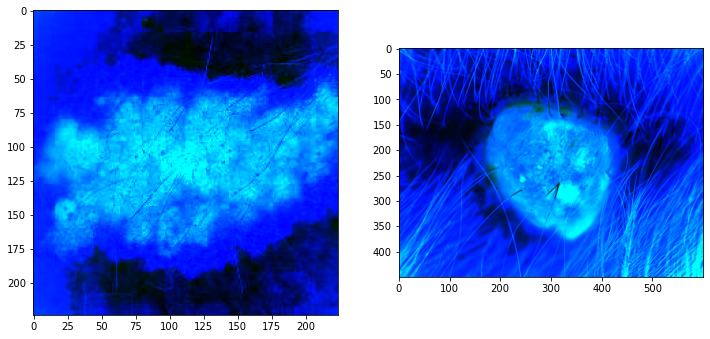

Range : 40


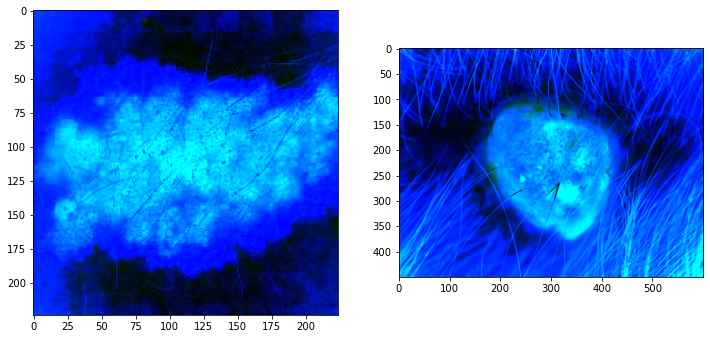

Range : 45


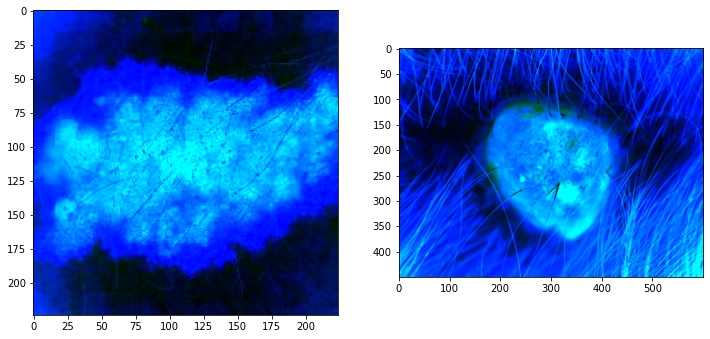

Range : 50


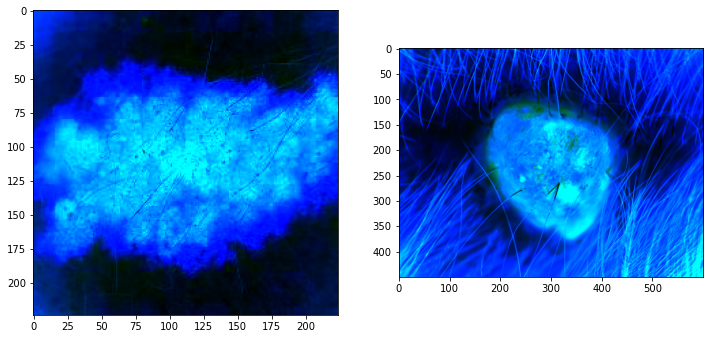

Range : 55


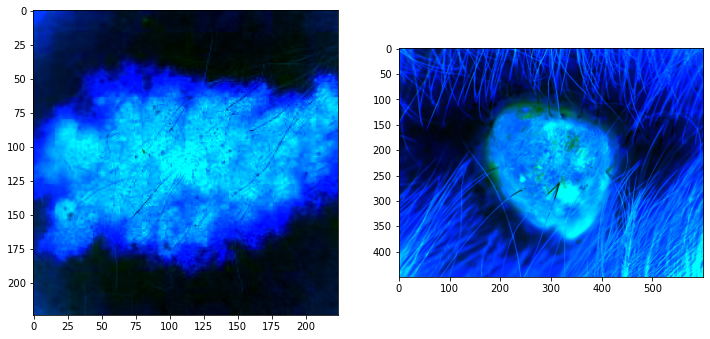

Range : 60


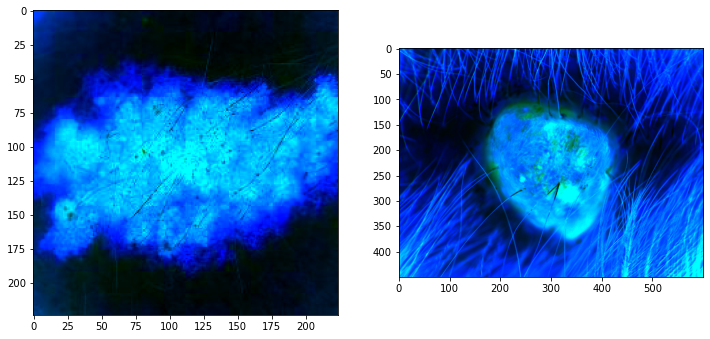

Range : 65


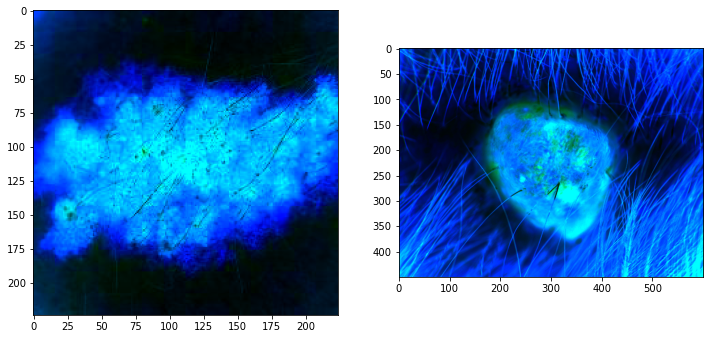

Range : 70


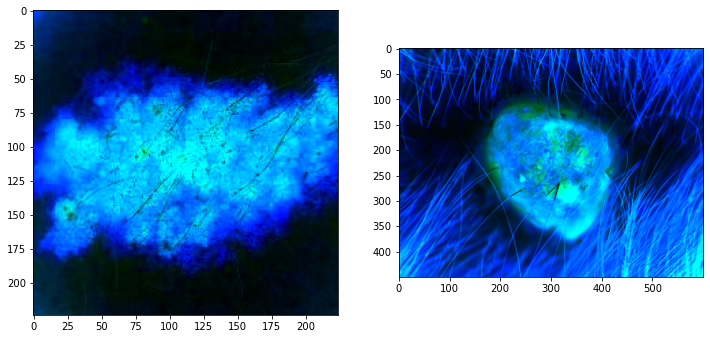

Range : 75


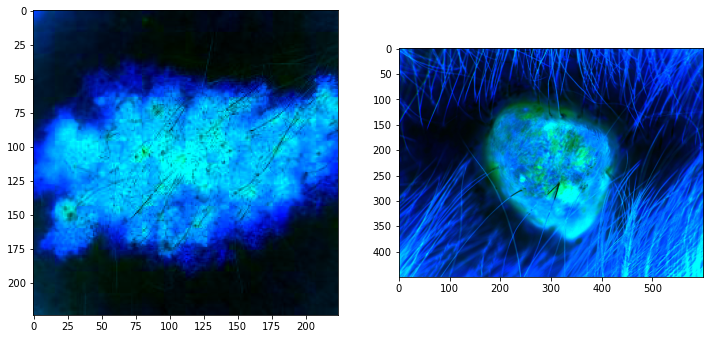

Range : 80


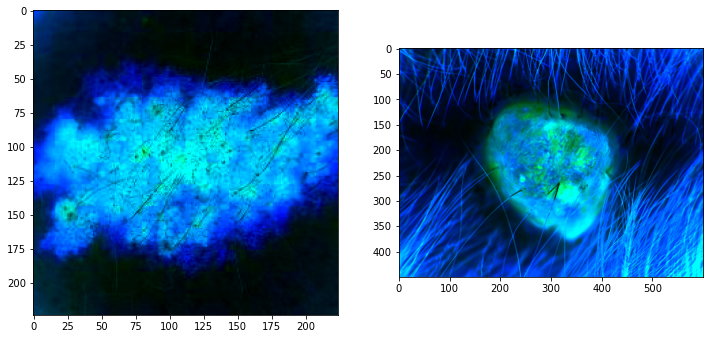

Range : 85


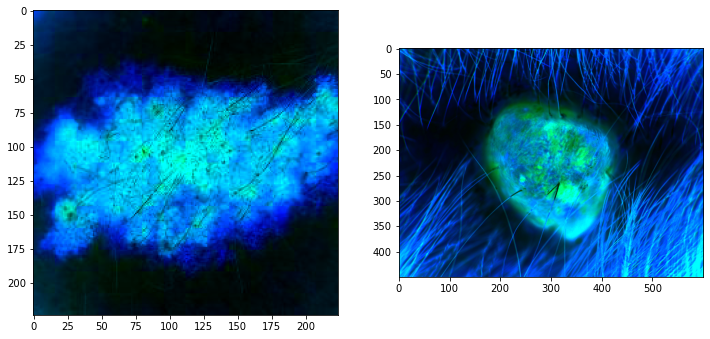

Range : 90


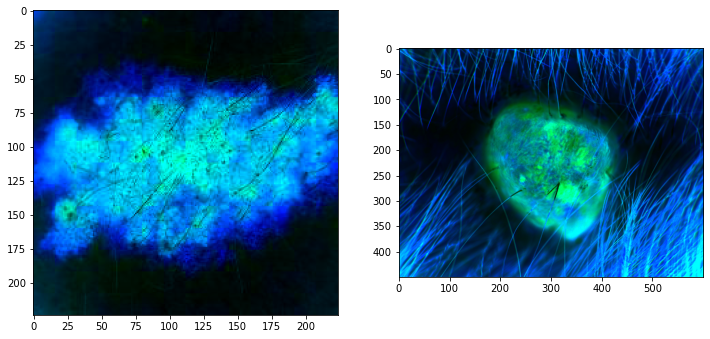

Range : 95


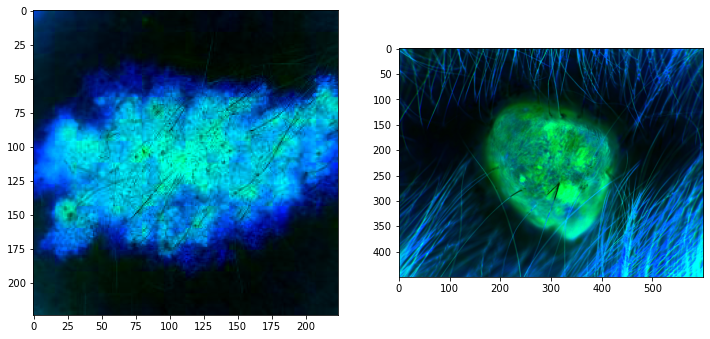

In [30]:
img_1 = imread(test_img_path_1, as_gray=False)
img_2 = imread(test_img_path_2, as_gray=False)


for i in range(0,100,5):
    print("Range :", i)
    fig = plt.figure(figsize=(12,8))
    ax  = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    ax.imshow(get_zdh(img_1, i))
    ax2.imshow(get_zdh(img_2, i))
    plt.show()

### HSV

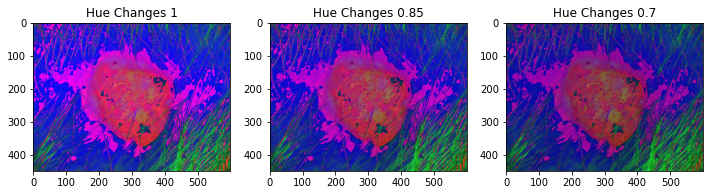

In [50]:
img = imread(test_img_path_2, as_gray=False)

def get_hsv(img, ratio):
    img_hue = color.rgb2hsv(img)
    img_hue[:,:,0] *= ratio
    #img_hue[:,:,1] *= ratio
    img_hue[:,:,2] *= ratio
    return img_hue

fig = plt.figure(figsize=(12,12))
ax  = fig.add_subplot(131)
ax2 = fig.add_subplot(132)
ax3 = fig.add_subplot(133)
ax.imshow(get_hsv(img, 1))
ax2.imshow(get_hsv(img, 0.85))
ax3.imshow(get_hsv(img, 0.7))
ax.set_title("Hue Changes 1")
ax2.set_title("Hue Changes 0.85")
ax3.set_title("Hue Changes 0.7");

### RGB

In [32]:
'''
R + B + G + RB + RG + BG => 6
with range 1-4 gives 24 augmentations
''';

### Exclude Red

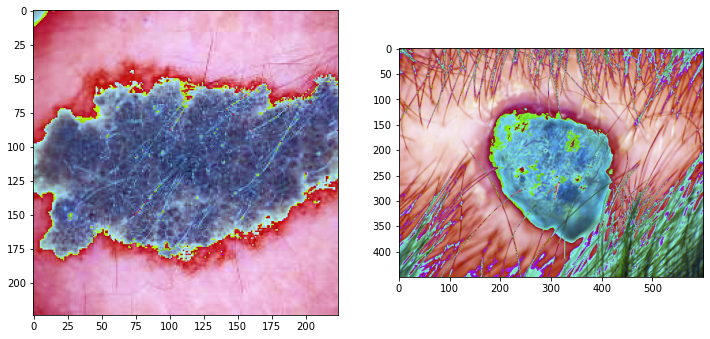

In [33]:
img_1 = imread(test_img_path_1, as_gray=False)
img_2 = imread(test_img_path_2, as_gray=False)

def get_rgb(img, ratio):
    img_r = img[:,:,0] #* ratio
    img_g = img[:,:,1] * ratio
    img_b = img[:,:,2] * ratio
    return np.dstack((img_r,img_g,img_b))

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax.imshow(get_rgb(img_1, 2))
ax2.imshow(get_rgb(img_2, 2));

### Exclude Green

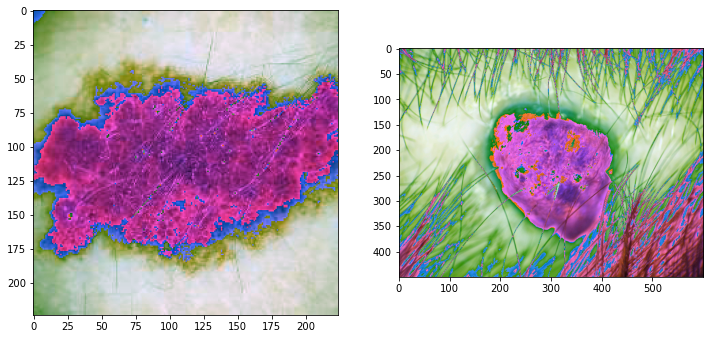

In [34]:
img_1 = imread(test_img_path_1, as_gray=False)
img_2 = imread(test_img_path_2, as_gray=False)

def get_rgb(img, ratio):
    img_r = img[:,:,0] * ratio
    img_g = img[:,:,1] #* ratio
    img_b = img[:,:,2] * ratio
    return np.dstack((img_r,img_g,img_b))

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax.imshow(get_rgb(img_1, 2))
ax2.imshow(get_rgb(img_2, 2));

### Exclude Blue

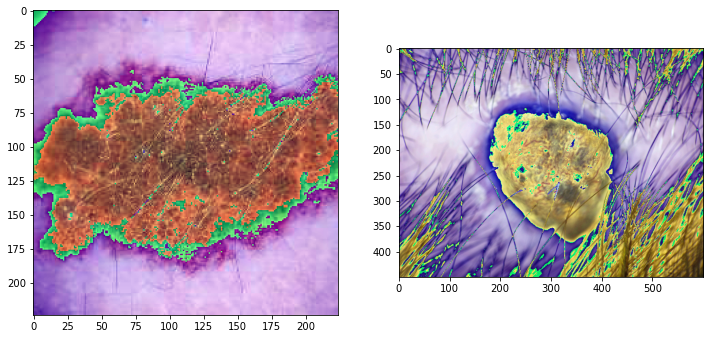

In [35]:
img_1 = imread(test_img_path_1, as_gray=False)
img_2 = imread(test_img_path_2, as_gray=False)

def get_rgb(img, ratio):
    img_r = img[:,:,0] * ratio
    img_g = img[:,:,1] * ratio
    img_b = img[:,:,2] #* ratio
    return np.dstack((img_r,img_g,img_b))

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax.imshow(get_rgb(img_1, 2))
ax2.imshow(get_rgb(img_2, 2));

### Exclude Green and Blue

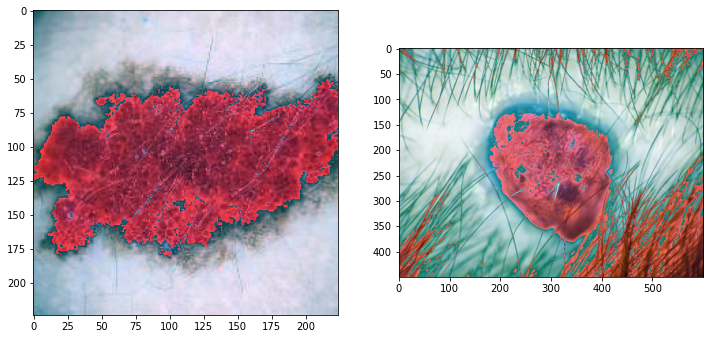

In [36]:
img_1 = imread(test_img_path_1, as_gray=False)
img_2 = imread(test_img_path_2, as_gray=False)

def get_rgb(img, ratio):
    img_r = img[:,:,0] * ratio
    img_g = img[:,:,1] #* ratio
    img_b = img[:,:,2] #* ratio
    return np.dstack((img_r,img_g,img_b))

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax.imshow(get_rgb(img_1, 2))
ax2.imshow(get_rgb(img_2, 2));

### Exclude Red and Green

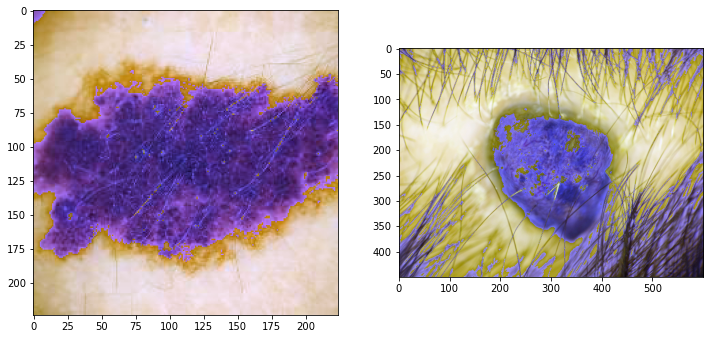

In [37]:
img_1 = imread(test_img_path_1, as_gray=False)
img_2 = imread(test_img_path_2, as_gray=False)

def get_rgb(img, ratio):
    img_r = img[:,:,0] #* ratio
    img_g = img[:,:,1] #* ratio
    img_b = img[:,:,2] * ratio
    return np.dstack((img_r,img_g,img_b))

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax.imshow(get_rgb(img_1, 2))
ax2.imshow(get_rgb(img_2, 2));

### Exclude Red and Blue

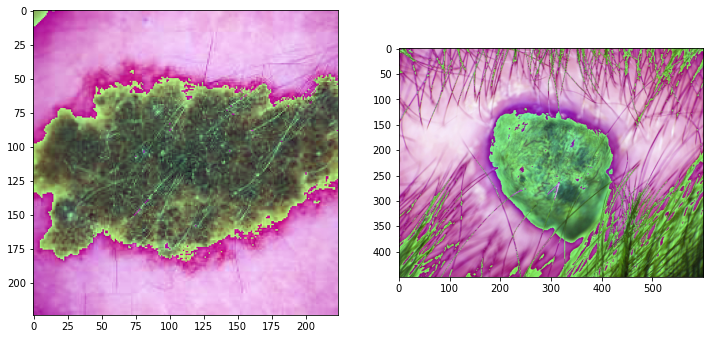

In [38]:
img_1 = imread(test_img_path_1, as_gray=False)
img_2 = imread(test_img_path_2, as_gray=False)

def get_rgb(img, ratio):
    img_r = img[:,:,0] #* ratio
    img_g = img[:,:,1] * ratio
    img_b = img[:,:,2] #* ratio
    return np.dstack((img_r,img_g,img_b))

fig = plt.figure(figsize=(12,8))
ax = fig.add_subplot(121)
ax2 = fig.add_subplot(122)
ax.imshow(get_rgb(img_1, 2))
ax2.imshow(get_rgb(img_2, 2));

### Range Check

Range : 1


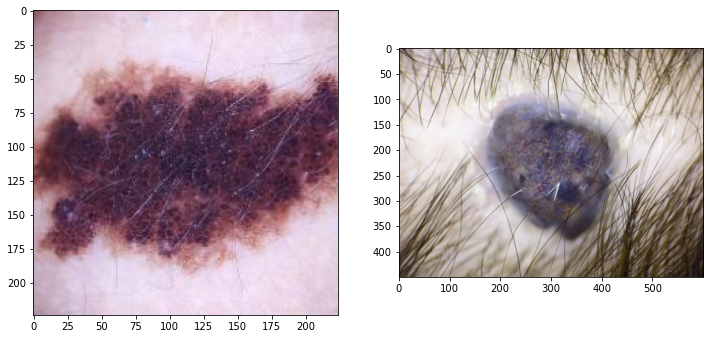

Range : 2


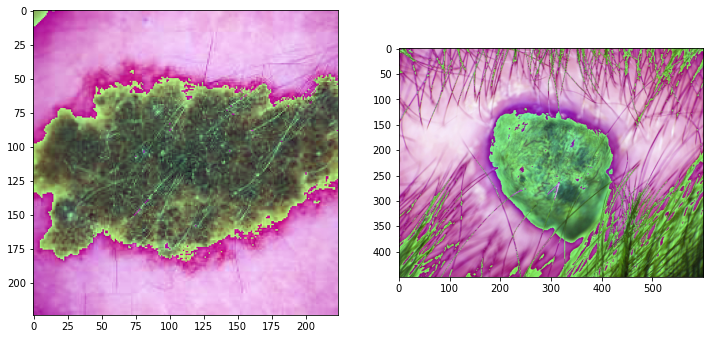

Range : 3


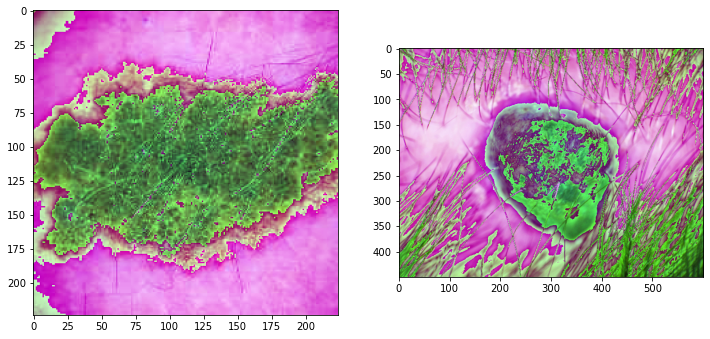

Range : 4


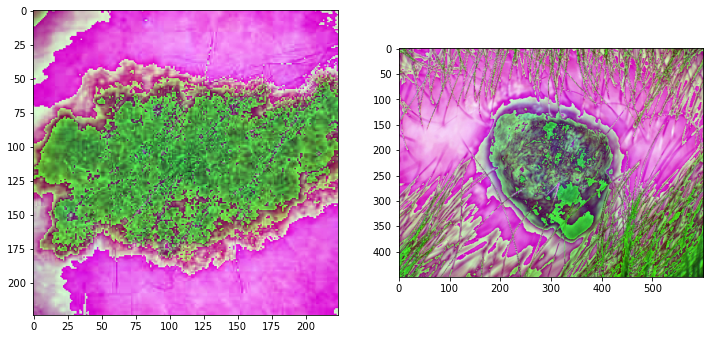

Range : 5


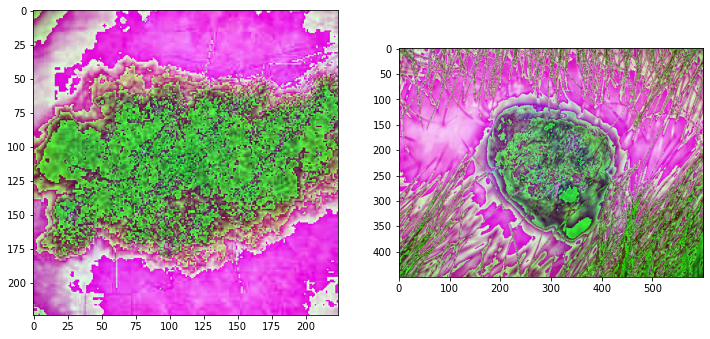

Range : 6


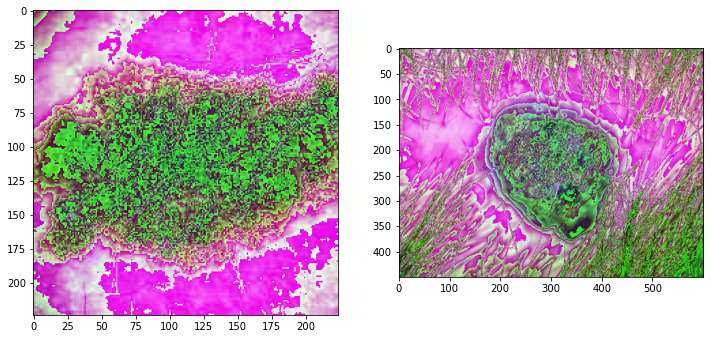

Range : 7


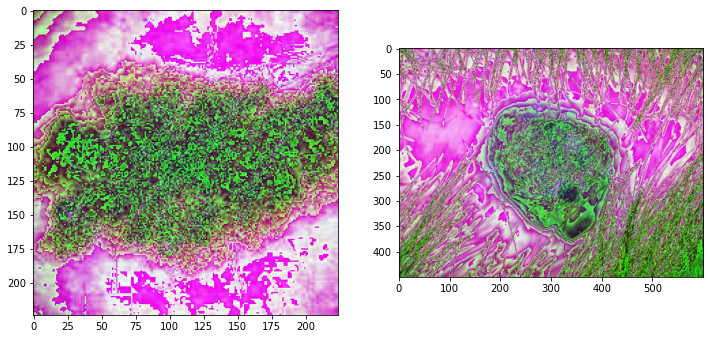

Range : 8


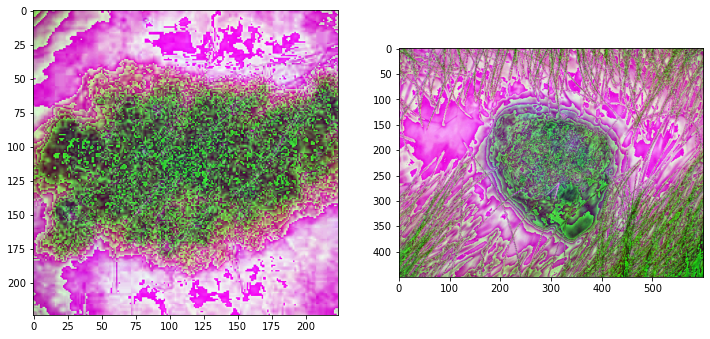

Range : 9


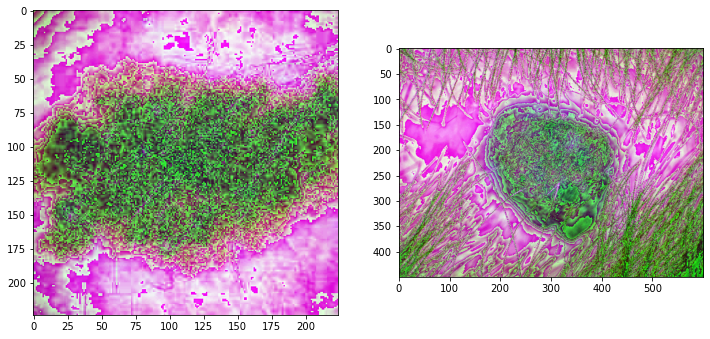

In [39]:
for i in range(1,10):
    print("Range :", i)
    fig = plt.figure(figsize=(12,8))
    ax = fig.add_subplot(121)
    ax2 = fig.add_subplot(122)
    ax.imshow(get_rgb(img_1, i))
    ax2.imshow(get_rgb(img_2, i))
    plt.show();

## Color Change Functions

In [53]:
path_out = DATA_PATH +"HAM10000_images_separated_colored_RGB/"

In [41]:
def get_rgb(img, ratio: int=1, filter_type: str=None):
    # Split original image to Red Green and Blue channels
    img_r, img_g, img_b = img[:,:,0], img[:,:,1], img[:,:,2]
    # Apply changes to different channels on demand
    if filter_type in ["R","RB","RG"]:
        img_r = img[:,:,0] * ratio
    if filter_type in ["G","RG","GB"]:
        img_g = img[:,:,1] * ratio
    if filter_type in ["B","RB","GB"]:
        img_b = img[:,:,2] * ratio
    return np.dstack((img_r,img_g,img_b))

# plt.imshow(get_rgb(img_1, 3, "R"))

In [42]:
def apply_color_rgb_n_times(img_path: str, img_path_out: str, img_class: str) -> None:
    dot_index = -4    
    img = imread(img_path, as_gray=False)
    augment_n = augment_multiplier[img_class]
    filters = ["R","G","B","RG","RB","GB"]

    if img_class == "nv":
        imsave(img_path_out, img, check_contrast=False, quality=100)
        return
    
    if augment_n in [3,9]: # bkl  mel  akiec
        filters = ["R","G","B"]
    steps = int(augment_n/len(filters))
    
    for filt in filters:
        for step in range(1,steps+1):            
            img_colored = get_rgb(img, step, filt)
            img_save_path = "{0}_{1}{2}{3}".format(
                        img_path_out[:dot_index],filt,step,img_path_out[dot_index:])
            imsave(img_save_path, img_to_uint8(img_colored), check_contrast=False, quality=100)


In [54]:
apply_all_img(path_in, path_out, apply_color_rgb_n_times) 

../../Data/HAM10000_images_separated/akiec/          294


100%|████████████████████████████████████████████████████████████████████████████████| 294/294 [00:06<00:00, 46.45it/s]


../../Data/HAM10000_images_separated/bcc/            462


100%|████████████████████████████████████████████████████████████████████████████████| 462/462 [00:06<00:00, 75.42it/s]


../../Data/HAM10000_images_separated/bkl/            989


100%|███████████████████████████████████████████████████████████████████████████████| 989/989 [00:07<00:00, 131.26it/s]


../../Data/HAM10000_images_separated/df/             103


100%|████████████████████████████████████████████████████████████████████████████████| 103/103 [00:06<00:00, 15.90it/s]


../../Data/HAM10000_images_separated/mel/           1001


100%|█████████████████████████████████████████████████████████████████████████████| 1001/1001 [00:06<00:00, 143.97it/s]


../../Data/HAM10000_images_separated/nv/            6034


100%|█████████████████████████████████████████████████████████████████████████████| 3017/3017 [00:07<00:00, 396.82it/s]


../../Data/HAM10000_images_separated/vasc/           127


100%|████████████████████████████████████████████████████████████████████████████████| 127/127 [00:05<00:00, 24.52it/s]

Time Elapsed :  0:00:46.262509


In [55]:
path_out = DATA_PATH +"HAM10000_images_separated_colored_HSV/"

In [59]:
def get_hsv(img, ratio: int=1, filter_type: str=None):
    img = color.rgb2hsv(img)
    # Split image to Hue Saturation and Value channels
    img_h, img_s, img_v = img[:,:,0], img[:,:,1], img[:,:,2]
    # Apply changes to different channels on demand
    if filter_type in ["H","HV","HS"]:
        img_h = img[:,:,0] * ratio
    if filter_type in ["S","HS","SV"]:
        img_s = img[:,:,1] * ratio
    if filter_type in ["V","HV","SV"]:
        img_v = img[:,:,2] * ratio
    return np.dstack((img_h,img_s,img_v))


In [62]:
def apply_color_hsv_n_times(img_path: str, img_path_out: str, img_class: str) -> None:
    dot_index = -4    
    img = imread(img_path, as_gray=False)
    augment_n = augment_multiplier[img_class]
    filters = ["H","S","V","HV","HS","SV"]

    if img_class == "nv":
        imsave(img_path_out, img, check_contrast=False, quality=100)
        return
    
    if augment_n in [3,9]: # bkl  mel  akiec
        filters = ["H","S","V"]
    steps = int(augment_n/len(filters))
    
    for filt in filters:
        for step in range(1,steps+1):            
            img_colored = get_hsv(img, step, filt)
            img_save_path = "{0}_{1}{2}{3}".format(
                        img_path_out[:dot_index],filt,step,img_path_out[dot_index:])
            imsave(img_save_path, img_to_uint8(img_colored), check_contrast=False, quality=100)


In [63]:
apply_all_img(path_in, path_out, apply_color_hsv_n_times) 

../../Data/HAM10000_images_separated/akiec/          294


100%|████████████████████████████████████████████████████████████████████████████████| 294/294 [00:32<00:00,  9.03it/s]


../../Data/HAM10000_images_separated/bcc/            462


100%|████████████████████████████████████████████████████████████████████████████████| 462/462 [00:34<00:00, 13.53it/s]


../../Data/HAM10000_images_separated/bkl/            989


100%|████████████████████████████████████████████████████████████████████████████████| 989/989 [00:37<00:00, 26.32it/s]


../../Data/HAM10000_images_separated/df/             103


100%|████████████████████████████████████████████████████████████████████████████████| 103/103 [00:30<00:00,  3.35it/s]


../../Data/HAM10000_images_separated/mel/           1001


100%|██████████████████████████████████████████████████████████████████████████████| 1001/1001 [00:37<00:00, 26.79it/s]


../../Data/HAM10000_images_separated/nv/            6034


100%|█████████████████████████████████████████████████████████████████████████████| 3017/3017 [00:07<00:00, 399.08it/s]


../../Data/HAM10000_images_separated/vasc/           127


100%|████████████████████████████████████████████████████████████████████████████████| 127/127 [00:27<00:00,  4.69it/s]

Time Elapsed :  0:03:27.135813
